<a href="https://colab.research.google.com/github/Anjasfedo/computer-vision/blob/main/UIEB_preprocess_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Dataset

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("larjeck/uieb-dataset-reference")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/larjeck/uieb-dataset-reference/versions/1


# Setup GDrive

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

gdrive_path = '/content/drive/MyDrive/under_water_2/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Choose 3 sample blur image

choose ["515_img_.png", "858_img_.png", "469_img_.png"]

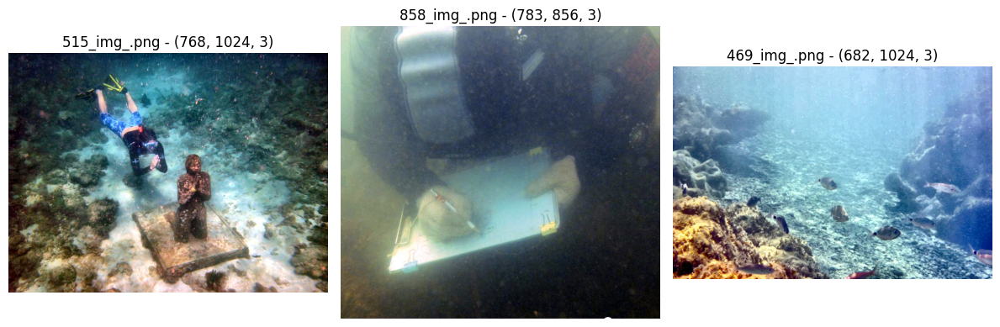

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

def show_images(image_folder, image_names):
    """
    Fungsi untuk menampilkan 3 gambar berdasarkan nama file.

    Args:
        image_folder (str): Path folder tempat gambar disimpan.
        image_names (list): Daftar nama file gambar yang akan ditampilkan (harus 3 gambar).
    """
    if len(image_names) != 3:
        print("Harap berikan tepat 3 nama file gambar.")
        return

    # Setup plot
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    for ax, image_name in zip(axes, image_names):
        # Membuat path lengkap ke gambar
        img_path = os.path.join(image_folder, image_name)

        # Membaca gambar
        image = cv2.imread(img_path)
        if image is None:
            print(f"Gambar tidak ditemukan atau gagal dibaca: {image_name}")
            continue

        # Konversi BGR ke RGB untuk menampilkan dengan matplotlib
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Menampilkan gambar
        ax.imshow(image)
        ax.set_title(f'{image_name} - {image.shape}')
        ax.axis("off")

    plt.tight_layout()
    plt.show()

# Contoh pemanggilan fungsi
image_folder = os.path.join(path, "reference-890")  # Path folder gambar

# Contoh daftar nama gambar (ganti dengan nama gambar asli)
image_names = ["515_img_.png", "858_img_.png", "469_img_.png"]

# Panggil fungsi untuk menampilkan gambar
show_images(image_folder, image_names)

Saved image to: /content/drive/MyDrive/under_water_2/original/515_img_.png
Saved image to: /content/drive/MyDrive/under_water_2/original/858_img_.png
Saved image to: /content/drive/MyDrive/under_water_2/original/469_img_.png


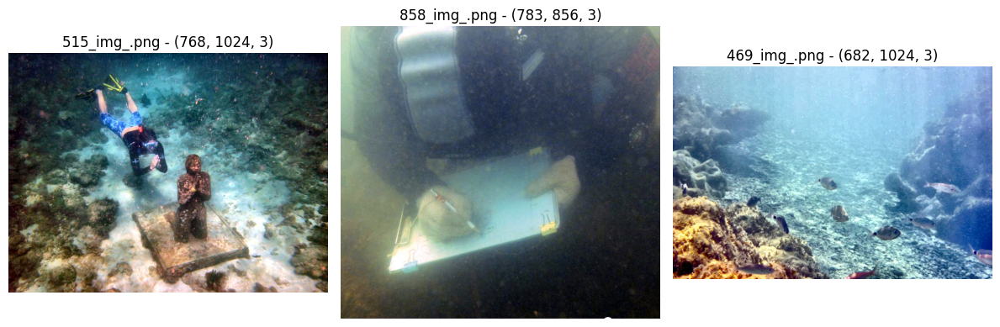

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

def show_images_and_save(image_folder, image_names, save_folder):
    """
    Function to display 3 images and save them to Google Drive.

    Args:
        image_folder (str): Path to the folder containing images.
        image_names (list): List of image file names to display (must be 3 images).
        save_folder (str): Path to the folder where images will be saved.
    """
    os.makedirs(save_folder, exist_ok=True)

    if len(image_names) != 3:
        print("Please provide exactly 3 image filenames.")
        return

    # Setup plot
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    for ax, image_name in zip(axes, image_names):
        # Full path to the image
        img_path = os.path.join(image_folder, image_name)

        # Read the image
        image = cv2.imread(img_path)
        if image is None:
            print(f"Image not found or failed to load: {img_path}")
            continue

        # Convert BGR to RGB for display
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Save image to Google Drive
        save_path = os.path.join(save_folder, image_name)
        cv2.imwrite(save_path, image)
        print(f"Saved image to: {save_path}")

        # Display image
        ax.imshow(image_rgb)
        ax.set_title(f'{image_name} - {image.shape}')
        ax.axis("off")

    plt.tight_layout()
    plt.show()

# Example usage
image_folder = os.path.join(path, "reference-890")
image_names = ["515_img_.png", "858_img_.png", "469_img_.png"]

save_folder = os.path.join(gdrive_path, 'original')

show_images_and_save(image_folder, image_names, save_folder)

# Change resolution into 500 x 500

Gambar disimpan: /content/drive/MyDrive/under_water_2/resize_500x500/515_img__500x500.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/resize_500x500/858_img__500x500.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/resize_500x500/469_img__500x500.png


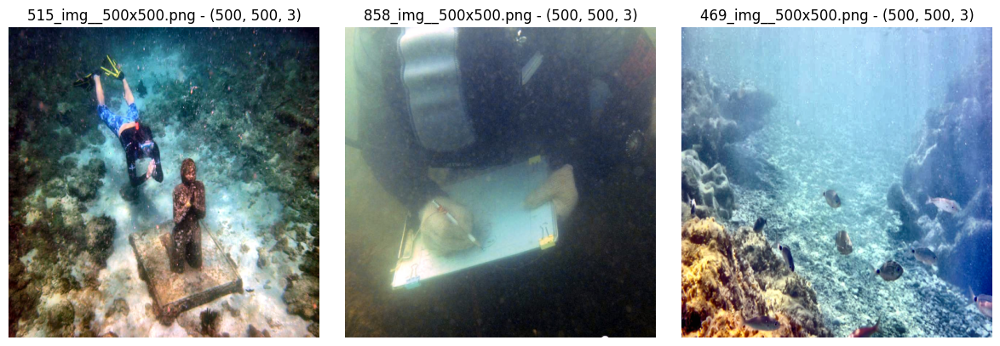

In [ ]:
import os
import cv2

def resize_and_save(image_folder, image_names, save_folder, target_size=(500, 500)):
    """
    Fungsi untuk me-resize gambar ke target_size dan menyimpannya ke /content/ dengan akhiran '_500x500'.

    Args:
        image_folder (str): Path folder tempat gambar asli.
        image_names (list): Daftar nama file gambar yang akan di-resize.
        target_size (tuple): Ukuran target untuk resize gambar (default: 500x500).
    """
    os.makedirs(save_folder, exist_ok=True)

    resized_image_names = []

    for image_name in image_names:
        # Membuat path lengkap ke gambar
        img_path = os.path.join(image_folder, image_name)

        # Membaca gambar
        image = cv2.imread(img_path)
        if image is None:
            print(f"Gagal membaca gambar: {image_name}")
            continue

        # Resize gambar ke target_size (500x500)
        resized_image = cv2.resize(image, target_size)

        # Membuat nama file baru dengan akhiran '_500x500'
        name, ext = os.path.splitext(image_name)
        new_image_name = f"{name}_500x500{ext}"
        resized_image_names.append(new_image_name)
        save_path = os.path.join(save_folder, new_image_name)

        # Simpan gambar yang sudah di-resize
        cv2.imwrite(save_path, resized_image)
        print(f"Gambar disimpan: {save_path}")

    return resized_image_names

# Contoh pemanggilan fungsi
image_folder = os.path.join(path, "reference-890")  # Path folder gambar asli

# Daftar nama gambar yang ingin di-resize
image_names = ["515_img_.png", "858_img_.png", "469_img_.png"]

save_folder = os.path.join(gdrive_path, 'resize_500x500')

resized_image_name = resize_and_save(image_folder, image_names, save_folder, target_size=(500, 500))

show_images(save_folder, resized_image_name)

# Enhance Image
with:
- CLAHE
- Histogram Equalization
- Adaptive HE
- Sharpening
- Smoothing

## CLAHE

In [ ]:
import cv2

def apply_clahe(image):
    """Terapkan CLAHE (Contrast Limited Adaptive Histogram Equalization)."""
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(9, 9))
    cl = clahe.apply(l)

    merged = cv2.merge((cl, a, b))
    return cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)

## Histogram Eqalization

In [ ]:
def apply_histogram_equalization(image):
    """Terapkan Histogram Equalization pada channel Luminance."""
    img_yuv = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
    return cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

## Adaptive HE

In [ ]:
def apply_adaptive_histogram_equalization(image):
    """Terapkan Adaptive Histogram Equalization menggunakan CLAHE."""
    return apply_clahe(image)

## Sharpeing

In [ ]:
import numpy as np

def apply_sharpening(image):
    """Terapkan High Pass Filter (Sharpening) menggunakan kernel sharpening."""
    kernel = np.array([
        [-1, -1, -1, -1, -1, -1, -1, -1, -1],
        [-1,  2,  2,  2,  2,  2,  2,  2, -1],
        [-1,  2,  4,  4,  4,  4,  4,  2, -1],
        [-1,  2,  4,  8,  8,  8,  4,  2, -1],
        [-1,  2,  4,  8, 16,  8,  4,  2, -1],
        [-1,  2,  4,  8,  8,  8,  4,  2, -1],
        [-1,  2,  4,  4,  4,  4,  4,  2, -1],
        [-1,  2,  2,  2,  2,  2,  2,  2, -1],
        [-1, -1, -1, -1, -1, -1, -1, -1, -1]
    ], dtype=np.float32)  # Kernel sharpening ukuran 9x9

    sharpened = cv2.filter2D(image, -1, kernel)  # Terapkan kernel sharpening
    return cv2.addWeighted(image, 1.5, sharpened, -0.5, 0)  # Gabungkan dengan gambar asli

## Smoothing

In [ ]:
def apply_smoothing(image):
    """Terapkan Low Pass Filter (Gaussian Blur) untuk smoothing."""
    return cv2.GaussianBlur(image, (9, 9), 0)

## Enhance & Save

In [ ]:
def enhance_and_save_images(image_folder, image_name, save_folder):
    """
    Terapkan berbagai algoritma pada satu gambar, tampilkan hasilnya, dan simpan ke folder berdasarkan metode.
    """
    filters = {
        "Original": lambda x: x,
        "CLAHE": apply_clahe,
        "HistogramEqualization": apply_histogram_equalization,
        "AdaptiveHE": apply_adaptive_histogram_equalization,
        "Sharpening": apply_sharpening,
        "Smoothing": apply_smoothing
    }

    # Membaca gambar
    img_path = os.path.join(image_folder, image_name)
    image = cv2.imread(img_path)

    if image is None:
        print(f"Gagal membaca gambar: {image_name}")
        return  # Menghentikan fungsi jika gambar tidak ditemukan

    # Buat folder penyimpanan jika belum ada
    os.makedirs(save_folder, exist_ok=True)

    # Setup plot untuk masing-masing filter
    plt.figure(figsize=(20, 10))
    plt.suptitle(f"Processing: {image_name}", fontsize=16)

    paths = []

    for idx, (filter_name, filter_func) in enumerate(filters.items()):
        processed_image = filter_func(image)

        # Construct subfolder for each filter method
        filter_folder = os.path.join(save_folder, filter_name)

        # Create the filter folder if it doesn't exist
        os.makedirs(filter_folder, exist_ok=True)

        # Save the image in the respective method folder
        name, ext = os.path.splitext(image_name)
        new_image_name = f"{name}_{filter_name}{ext}"
        save_path = os.path.join(filter_folder, new_image_name)

        # Save the processed image
        cv2.imwrite(save_path, processed_image)
        print(f"Gambar disimpan: {save_path}")

        # Convert from BGR to RGB for displaying with matplotlib
        processed_image_rgb = cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB)

        # Display the image
        plt.subplot(2, 3, idx + 1)
        plt.imshow(processed_image_rgb)
        plt.title(filter_name)
        plt.axis("off")

        # Collect the saved paths (optional)
        paths.append(new_image_name)

    plt.tight_layout()
    plt.show()

    return paths

Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/Original/515_img__500x500_Original.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/CLAHE/515_img__500x500_CLAHE.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/HistogramEqualization/515_img__500x500_HistogramEqualization.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/AdaptiveHE/515_img__500x500_AdaptiveHE.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/Sharpening/515_img__500x500_Sharpening.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/Smoothing/515_img__500x500_Smoothing.png


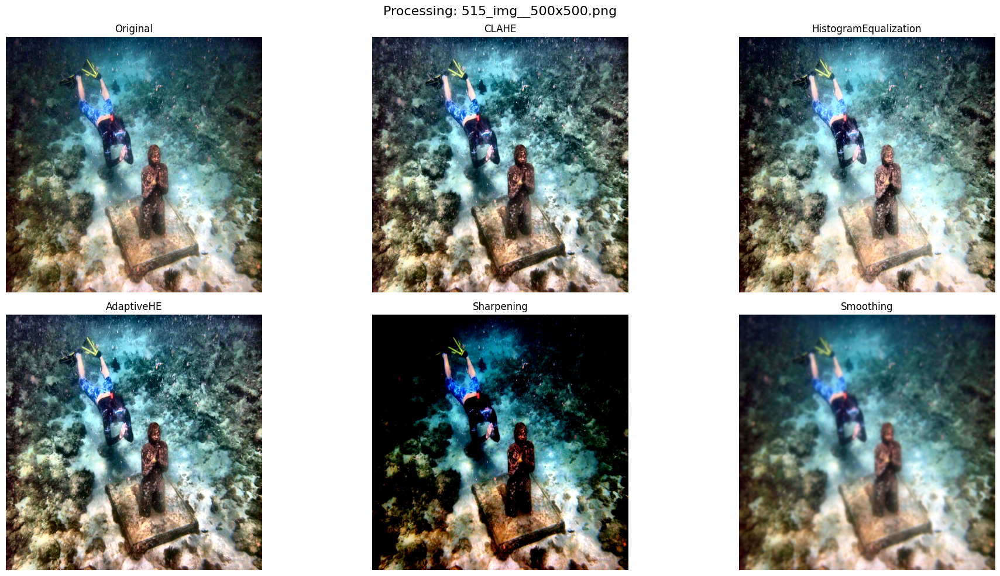

Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/Original/858_img__500x500_Original.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/CLAHE/858_img__500x500_CLAHE.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/HistogramEqualization/858_img__500x500_HistogramEqualization.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/AdaptiveHE/858_img__500x500_AdaptiveHE.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/Sharpening/858_img__500x500_Sharpening.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/Smoothing/858_img__500x500_Smoothing.png


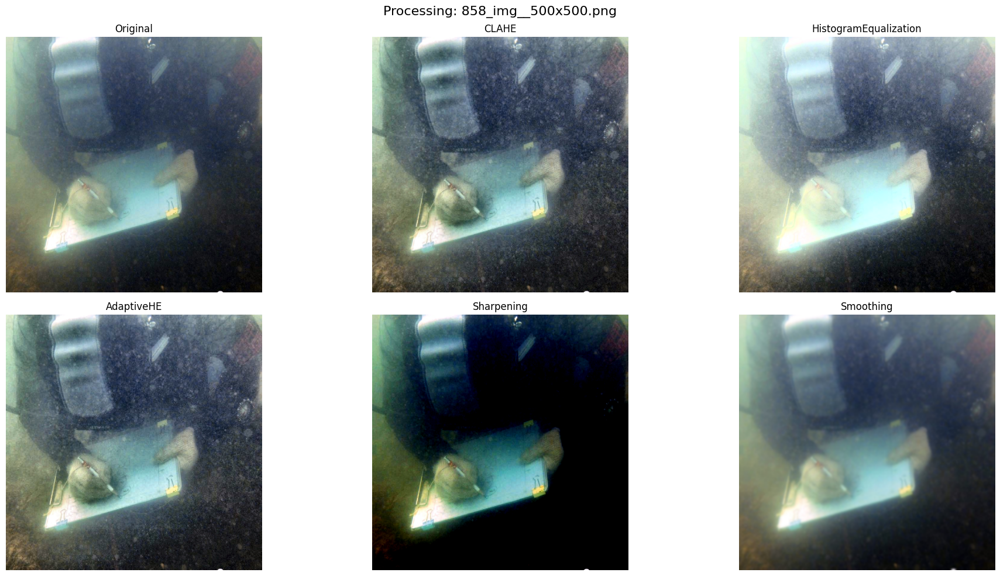

Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/Original/469_img__500x500_Original.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/CLAHE/469_img__500x500_CLAHE.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/HistogramEqualization/469_img__500x500_HistogramEqualization.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/AdaptiveHE/469_img__500x500_AdaptiveHE.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/Sharpening/469_img__500x500_Sharpening.png
Gambar disimpan: /content/drive/MyDrive/under_water_2/enhance_images/Smoothing/469_img__500x500_Smoothing.png


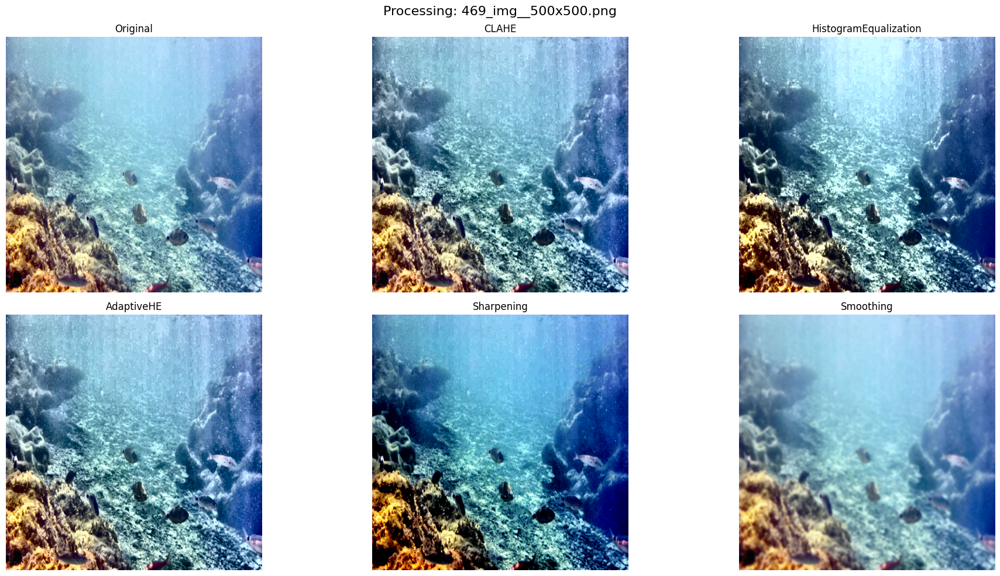

[['515_img__500x500_Original.png',
  '515_img__500x500_CLAHE.png',
  '515_img__500x500_HistogramEqualization.png',
  '515_img__500x500_AdaptiveHE.png',
  '515_img__500x500_Sharpening.png',
  '515_img__500x500_Smoothing.png'],
 ['858_img__500x500_Original.png',
  '858_img__500x500_CLAHE.png',
  '858_img__500x500_HistogramEqualization.png',
  '858_img__500x500_AdaptiveHE.png',
  '858_img__500x500_Sharpening.png',
  '858_img__500x500_Smoothing.png'],
 ['469_img__500x500_Original.png',
  '469_img__500x500_CLAHE.png',
  '469_img__500x500_HistogramEqualization.png',
  '469_img__500x500_AdaptiveHE.png',
  '469_img__500x500_Sharpening.png',
  '469_img__500x500_Smoothing.png']]

In [ ]:
# Path folder sumber & tujuan penyimpanan
image_folder = "/content/drive/MyDrive/under_water_2/resize_500x500/"
save_folder = f"{gdrive_path}enhance_images/"

# Daftar gambar yang akan diproses
resized_image_names = ["515_img__500x500.png", "858_img__500x500.png", "469_img__500x500.png"]

enhance_image_paths = []

for image_name in resized_image_names:
    enhance_image_paths.append(enhance_and_save_images(image_folder, image_name, save_folder))

enhance_image_paths

# Evaluation

In [ ]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity as skimage_ssim

class ImageMetrics:
    def __init__(self, ori_image):
        """
        Initialize the ImageMetrics class with the original image path.

        Args:
            ori_image (str): Path to the original image.
        """
        self.ori_image = ori_image

    @staticmethod
    def calculate_mse(original, stego):
        """
        Calculate the Mean Squared Error (MSE) between two images.

        Args:
            original (numpy.ndarray): Original image array.
            stego (numpy.ndarray): Stego image array.

        Returns:
            float: The MSE value.
        """
        return np.mean((original - stego) ** 2)

    def calculate_psnr(self, stego_image_path):
        """
        Calculate the Peak Signal-to-Noise Ratio (PSNR) between the original and stego image.

        Args:
            stego_image_path (str): Path to the stego image.

        Returns:
            float: The PSNR value.
        """
        # Read images
        original = cv2.imread(self.ori_image)
        stego = cv2.imread(stego_image_path)

        if original is None:
            raise ValueError(f"Failed to load original image from {self.ori_image}. Ensure the file exists and is a valid image format.")
        if stego is None:
            raise ValueError(f"Failed to load stego image from {stego_image_path}. Ensure the file exists and is a valid image format.")

        # Calculate MSE
        mse = self.calculate_mse(original, stego)
        if mse == 0:  # If images are identical
            return float('inf')

        # Calculate PSNR
        max_pixel_value = 255.0
        psnr = 10 * np.log10((max_pixel_value ** 2) / mse)
        return psnr

    @staticmethod
    def calculate_ssim(original, stego):
        """
        Calculate the Structural Similarity Index (SSIM) between two images.

        Args:
            original (numpy.ndarray): Original image array.
            stego (numpy.ndarray): Stego image array.

        Returns:
            float: The SSIM value.
        """
        original_gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
        stego_gray = cv2.cvtColor(stego, cv2.COLOR_BGR2GRAY)

        ssim_value, _ = skimage_ssim(original_gray, stego_gray, full=True)
        return ssim_value

    @staticmethod
    def correlation_coefficient(original, stego):
        """
        Calculate the Pearson Correlation Coefficient (CoC) between the original and stego image.

        Args:
            original (numpy.ndarray): Original image array.
            stego (numpy.ndarray): Stego image array.

        Returns:
            float: The Pearson Correlation Coefficient (CoC) value.
        """
        # Flatten images to 1D arrays
        original_flat = original.flatten()
        stego_flat = stego.flatten()

        # Calculate Pearson Correlation Coefficient
        correlation = np.corrcoef(original_flat, stego_flat)[0, 1]
        return correlation

    @staticmethod
    def compute_gradient(image):
        """
        Compute the gradient magnitude of the image using the Sobel operator.

        Args:
            image (numpy array): The image for which the gradient is to be computed.

        Returns:
            numpy array: The gradient magnitude image.
        """
        grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
        grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
        grad_mag = cv2.magnitude(grad_x, grad_y)
        return grad_mag

    @staticmethod
    def edge_preservation_index(original, stego):
        """
        Calculate the Edge Preservation Index (EPI) between the original and stego image.

        Args:
            original (numpy.ndarray): Original image array.
            stego (numpy.ndarray): Stego image array.

        Returns:
            float: The Edge Preservation Index (EPI).
        """
        # Convert images to grayscale if they are not already
        if len(original.shape) > 2:
            original = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
        if len(stego.shape) > 2:
            stego = cv2.cvtColor(stego, cv2.COLOR_BGR2GRAY)

        grad_orig = ImageMetrics.compute_gradient(original)
        grad_stego = ImageMetrics.compute_gradient(stego)

        # Calculate numerator and denominator for EPI
        numerator = np.sum(np.abs(grad_orig - grad_stego))
        denominator = np.sum(np.abs(grad_orig))

        epi = numerator / denominator if denominator != 0 else 0
        return epi

    def calculate_metrics(self, stego_image_path):
        """
        Calculate MSE, PSNR, SSIM, CoC, and EPI between the original and stego image.

        Args:
            stego_image_path (str): Path to the stego image.

        Returns:
            tuple: MSE, PSNR, SSIM, CoC, and EPI values.
        """
        # Read images
        original = cv2.imread(self.ori_image)
        stego = cv2.imread(stego_image_path)

        if original is None:
            raise ValueError(f"Failed to load original image from {self.ori_image}. Ensure the file exists and is a valid image format.")
        if stego is None:
            raise ValueError(f"Failed to load stego image from {stego_image_path}. Ensure the file exists and is a valid image format.")

        # Calculate metrics
        mse_value = self.calculate_mse(original, stego)
        psnr_value = self.calculate_psnr(stego_image_path)
        ssim_value = self.calculate_ssim(original, stego)
        coc_value = self.correlation_coefficient(original, stego)
        epi_value = self.edge_preservation_index(original, stego)

        # Print results
        print(f'Metrics between original ({self.ori_image}) and stego image ({stego_image_path}):')
        print(f'MSE: {mse_value}')
        print(f'PSNR: {psnr_value}')
        print(f'SSIM: {ssim_value}')
        print(f'Correlation Coefficient (CoC): {coc_value}')
        print(f'Edge Preservation Index (EPI): {epi_value}')

        return mse_value, psnr_value, ssim_value, coc_value, epi_value

In [ ]:
enhance_image_paths

[['515_img__500x500_Original.png',
  '515_img__500x500_CLAHE.png',
  '515_img__500x500_HistogramEqualization.png',
  '515_img__500x500_AdaptiveHE.png',
  '515_img__500x500_Sharpening.png',
  '515_img__500x500_Smoothing.png'],
 ['858_img__500x500_Original.png',
  '858_img__500x500_CLAHE.png',
  '858_img__500x500_HistogramEqualization.png',
  '858_img__500x500_AdaptiveHE.png',
  '858_img__500x500_Sharpening.png',
  '858_img__500x500_Smoothing.png'],
 ['469_img__500x500_Original.png',
  '469_img__500x500_CLAHE.png',
  '469_img__500x500_HistogramEqualization.png',
  '469_img__500x500_AdaptiveHE.png',
  '469_img__500x500_Sharpening.png',
  '469_img__500x500_Smoothing.png']]

In [ ]:
method_names = ['Original/', 'CLAHE/', 'HistogramEqualization/', 'AdaptiveHE/', 'Sharpening/', 'Smoothing/']

# Assuming the images are stored in a specific directory
image_directory = f'{gdrive_path}enhance_images/'  # Change this to your image folder

results = []
# Loop through each set of images in `enhance_image_paths`
for group in enhance_image_paths:
    original_image_path = image_directory + method_names[0] + group[0]  # The first image is the original
    metrics = ImageMetrics(original_image_path)  # Initialize ImageMetrics with the original image

    for method_name in method_names:  # Skip 'Original' as it's already included
        # Loop through the processed images for each method
        processed_image_name = group[method_names.index(method_name)]  # Get corresponding processed image name
        processed_image_path = image_directory + method_name + processed_image_name

        # Calculate the metrics for the original and processed image
        print()
        print(f"Calculating metrics for {original_image_path} and {processed_image_path}:")
        mse, psnr, ssim, coc, epi = metrics.calculate_metrics(processed_image_path)

        # Store results in a list
        results.append({
            'Original Image': group[0],
            'Processed Image': processed_image_name,
            'Method': method_name.strip('/'),  # Remove the trailing slash from the method name
            'MSE': mse,
            'PSNR': psnr,
            'SSIM': ssim,
            'CoC': coc,
            'EPI': epi
        })


Calculating metrics for /content/drive/MyDrive/under_water_2/enhance_images/Original/515_img__500x500_Original.png and /content/drive/MyDrive/under_water_2/enhance_images/Original/515_img__500x500_Original.png:
Metrics between original (/content/drive/MyDrive/under_water_2/enhance_images/Original/515_img__500x500_Original.png) and stego image (/content/drive/MyDrive/under_water_2/enhance_images/Original/515_img__500x500_Original.png):
MSE: 0.0
PSNR: inf
SSIM: 1.0
Correlation Coefficient (CoC): 1.0
Edge Preservation Index (EPI): 0.0

Calculating metrics for /content/drive/MyDrive/under_water_2/enhance_images/Original/515_img__500x500_Original.png and /content/drive/MyDrive/under_water_2/enhance_images/CLAHE/515_img__500x500_CLAHE.png:
Metrics between original (/content/drive/MyDrive/under_water_2/enhance_images/Original/515_img__500x500_Original.png) and stego image (/content/drive/MyDrive/under_water_2/enhance_images/CLAHE/515_img__500x500_CLAHE.png):
MSE: 99.05770133333333
PSNR: 28.1

# Process the evaluation

In [ ]:
import pandas as pd

df_results = pd.DataFrame(results)

df_results.head()

,Original Image,Processed Image,Method,MSE,PSNR,SSIM,CoC,EPI
0,515_img__500x500_Original.png,515_img__500x500_Original.png,Original,0.000000,inf,1.000000,1.000000,0.000000
1,515_img__500x500_Original.png,515_img__500x500_CLAHE.png,CLAHE,99.057701,28.171921,0.819101,0.894941,0.657332
2,515_img__500x500_Original.png,515_img__500x500_HistogramEqualization.png,HistogramEqualization,110.177665,27.709868,0.889047,0.978558,0.382191
3,515_img__500x500_Original.png,515_img__500x500_AdaptiveHE.png,AdaptiveHE,99.057701,28.171921,0.819101,0.894941,0.657332
4,515_img__500x500_Original.png,515_img__500x500_Sharpening.png,Sharpening,105.378099,27.903300,0.444110,0.951121,0.526125


In [ ]:
def add_image_column(df):
    """
    Add a column 'Image' with the unique original image name for each group of processed images.

    Args:
        df (pandas.DataFrame): DataFrame with original and processed image information.

    Returns:
        pandas.DataFrame: DataFrame with the added 'Image' column.
    """
    # Extract unique original image name from the 'Original Image' column
    df['Image'] = df['Original Image'].apply(lambda x: x.split('_')[0])  # Extract the unique image identifier part

    return df

# Apply the function to add the 'Image' column
df_results = add_image_column(df_results)

df_results.head()  # Display the first few rows of the updated DataFrame

,Original Image,Processed Image,Method,MSE,PSNR,SSIM,CoC,EPI,Image
0,515_img__500x500_Original.png,515_img__500x500_Original.png,Original,0.000000,inf,1.000000,1.000000,0.000000,515
1,515_img__500x500_Original.png,515_img__500x500_CLAHE.png,CLAHE,99.057701,28.171921,0.819101,0.894941,0.657332,515
2,515_img__500x500_Original.png,515_img__500x500_HistogramEqualization.png,HistogramEqualization,110.177665,27.709868,0.889047,0.978558,0.382191,515
3,515_img__500x500_Original.png,515_img__500x500_AdaptiveHE.png,AdaptiveHE,99.057701,28.171921,0.819101,0.894941,0.657332,515
4,515_img__500x500_Original.png,515_img__500x500_Sharpening.png,Sharpening,105.378099,27.903300,0.444110,0.951121,0.526125,515


In [ ]:
df_results.drop(columns=['Original Image', 'Processed Image', 'MSE'], inplace=True)

df_results.head()

,Method,PSNR,SSIM,CoC,EPI,Image
0,Original,inf,1.000000,1.000000,0.000000,515
1,CLAHE,28.171921,0.819101,0.894941,0.657332,515
2,HistogramEqualization,27.709868,0.889047,0.978558,0.382191,515
3,AdaptiveHE,28.171921,0.819101,0.894941,0.657332,515
4,Sharpening,27.903300,0.444110,0.951121,0.526125,515


In [ ]:
# Reorder the columns to place 'Image' as the first column
df_results = df_results[['Image', 'Method', 'PSNR', 'SSIM', 'CoC', 'EPI']]

df_results.head()

,Image,Method,PSNR,SSIM,CoC,EPI
0,515,Original,inf,1.000000,1.000000,0.000000
1,515,CLAHE,28.171921,0.819101,0.894941,0.657332
2,515,HistogramEqualization,27.709868,0.889047,0.978558,0.382191
3,515,AdaptiveHE,28.171921,0.819101,0.894941,0.657332
4,515,Sharpening,27.903300,0.444110,0.951121,0.526125


In [ ]:
df_results['Method'] = df_results['Method'].replace({
    'HistogramEqualization': 'Histogram Equalization',
    'AdaptiveHE': 'Adaptive HE'
})

df_results.head()

,Image,Method,PSNR,SSIM,CoC,EPI
0,515,Original,inf,1.000000,1.000000,0.000000
1,515,CLAHE,28.171921,0.819101,0.894941,0.657332
2,515,Histogram Equalization,27.709868,0.889047,0.978558,0.382191
3,515,Adaptive HE,28.171921,0.819101,0.894941,0.657332
4,515,Sharpening,27.903300,0.444110,0.951121,0.526125


In [ ]:
# Sort the 'Method' column in ascending order as requested
method_order = ['Original', 'CLAHE', 'Histogram Equalization', 'Adaptive HE', 'Sharpening', 'Smoothing']

# Ensure the 'Method' column is a categorical type with the specific order
df_results['Method'] = pd.Categorical(df_results['Method'], categories=method_order, ordered=True)

# Sort the DataFrame based on the 'Method' column
df_results_sorted = df_results.sort_values('Method')

# Pivot the data again to ensure the methods are sorted
df_pivoted_final_sorted = df_results_sorted.melt(id_vars=["Image", "Method"], var_name="Metric", value_name="Value")
df_pivoted_final_sorted = df_pivoted_final_sorted.pivot_table(index=["Image", "Method"], columns="Metric", values="Value", aggfunc="first")

# Reset the index and display the sorted DataFrame
df_pivoted_final_sorted = df_pivoted_final_sorted.reset_index()

# Show the result for verification
df_pivoted_final_sorted.head()

<ipython-input-54-b0a7b2aa336c>:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_pivoted_final_sorted = df_pivoted_final_sorted.pivot_table(index=["Image", "Method"], columns="Metric", values="Value", aggfunc="first")


Metric,Image,Method,CoC,EPI,PSNR,SSIM
0,469,Original,1.000000,0.000000,inf,1.000000
1,469,CLAHE,0.949525,0.635231,28.351422,0.830665
2,469,Histogram Equalization,0.956507,0.657239,27.695140,0.782400
3,469,Adaptive HE,0.949525,0.635231,28.351422,0.830665
4,469,Sharpening,0.979737,0.434095,28.100133,0.799359


In [ ]:
folder_path = f'{gdrive_path}evaluation/'

os.makedirs(folder_path, exist_ok=True)

file_path = f'{folder_path}evaluation_result_pivoted.xlsx'

df_pivoted_final_sorted.to_excel(file_path, index=False)

file_path

'/content/drive/MyDrive/under_water_2/evaluation/evaluation_result_pivoted.xlsx'

In [ ]:
# Sort the DataFrame based on the specific order of 'Method' names
method_order = ['Original', 'CLAHE', 'Histogram Equalization', 'Adaptive HE', 'Sharpening', 'Smoothing']

# Set 'Method' to be a categorical column with the specific order
df_sorted_by_method = df_pivoted_final_sorted.copy()
df_sorted_by_method['Method'] = pd.Categorical(df_sorted_by_method['Method'], categories=method_order, ordered=True)

# Sort the DataFrame based on 'Method'
df_sorted_by_method = df_sorted_by_method.sort_values('Method')


# Show the result for verification
df_sorted_by_method.head()


Metric,Image,Method,CoC,EPI,PSNR,SSIM
0,469,Original,1.000000,0.000000,inf,1.000000
12,858,Original,1.000000,0.000000,inf,1.000000
6,515,Original,1.000000,0.000000,inf,1.000000
1,469,CLAHE,0.949525,0.635231,28.351422,0.830665
13,858,CLAHE,0.943744,1.094697,28.696784,0.813786


In [ ]:
folder_path = f'{gdrive_path}evaluation/'

os.makedirs(folder_path, exist_ok=True)

file_path = f'{folder_path}evaluation_result_sorted.xlsx'

df_sorted_by_method.to_excel(file_path, index=False)

file_path

'/content/drive/MyDrive/under_water_2/evaluation/evaluation_result_sorted.xlsx'

In [ ]:
# Define the custom sorting order for 'Image'
image_order = ['469', '515', '858']

# Set 'Image' to be a categorical column with the custom order
df_sorted_by_method['Image'] = pd.Categorical(df_sorted_by_method['Image'], categories=image_order, ordered=True)

# Define the custom sorting order for 'Method'
method_order = ['Original', 'CLAHE', 'Histogram Equalization', 'Adaptive HE', 'Sharpening', 'Smoothing']

# Set 'Method' to be a categorical column with the specific order
df_sorted_by_method['Method'] = pd.Categorical(df_sorted_by_method['Method'], categories=method_order, ordered=True)

# Now, sort the DataFrame by both 'Image' and 'Method'
df_sorted = df_sorted_by_method.sort_values(by=['Method', 'Image'])

df_sorted.head()

Metric,Image,Method,CoC,EPI,PSNR,SSIM
0,469,Original,1.000000,0.000000,inf,1.000000
6,515,Original,1.000000,0.000000,inf,1.000000
12,858,Original,1.000000,0.000000,inf,1.000000
1,469,CLAHE,0.949525,0.635231,28.351422,0.830665
7,515,CLAHE,0.894941,0.657332,28.171921,0.819101


In [ ]:
folder_path = f'{gdrive_path}evaluation/'

os.makedirs(folder_path, exist_ok=True)

file_path = f'{folder_path}evaluation_result_sorted_image.xlsx'

df_sorted.to_excel(file_path, index=False)

file_path

'/content/drive/MyDrive/under_water_2/evaluation/evaluation_result_sorted_image.xlsx'

In [ ]:
import matplotlib.pyplot as plt

def plot_metrics_bar(df, image_id, metrics, folder):
    os.makedirs(folder, exist_ok=True)
    # Filter the data for the selected image_id
    filtered_data = df[df['Image'] == image_id]

    # Create the bar chart with wider dimensions
    fig, ax = plt.subplots(figsize=(20, 8))

    # Define color map for methods
    method_colors = {
        'Original': 'blue',
        'CLAHE': 'green',
        'Histogram Equalization': 'red',
        'Adaptive HE': 'orange',
        'Sharpening': 'purple',
        'Smoothing': 'yellow'
    }

    # Loop through each method and plot its corresponding bar
    for method in filtered_data['Method']:
        method_data = filtered_data[filtered_data['Method'] == method]
        ax.bar(method, method_data[metrics].values[0], color=method_colors[method], label=method)

    ax.set_xlabel('Method')
    ax.set_ylabel(metrics)
    ax.set_title(f'{metrics} for Image {image_id}')

    # Show legend
    ax.legend(title='Methods', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)

    plt.tight_layout()
    # plt.show()

    # Ensure folder exists and create the file name
    if not os.path.exists(folder):
        os.makedirs(folder, exist_ok=True)

    filename = os.path.join(folder, f'{metrics}_plot_image_{image_id}.png')

    # Save the plot as an image file
    plt.savefig(filename, bbox_inches='tight')
    plt.close()
    print(f"Plot saved as {filename}")

In [ ]:
import matplotlib.pyplot as plt

def plot_metrics_bar_show(df, image_id, metrics):
    # Filter the data for the selected image_id
    filtered_data = df[df['Image'] == image_id]

    # Create the bar chart with wider dimensions
    fig, ax = plt.subplots(figsize=(20, 8))

    # Define color map for methods
    method_colors = {
        'Original': 'blue',
        'CLAHE': 'green',
        'Histogram Equalization': 'red',
        'Adaptive HE': 'orange',
        'Sharpening': 'purple',
        'Smoothing': 'yellow'
    }

    # Loop through each method and plot its corresponding bar
    for method in filtered_data['Method']:
        method_data = filtered_data[filtered_data['Method'] == method]
        ax.bar(method, method_data[metrics].values[0], color=method_colors[method], label=method)

    ax.set_xlabel('Method')
    ax.set_ylabel(metrics)
    ax.set_title(f'{metrics} for Image {image_id}')

    # Show legend
    ax.legend(title='Methods', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)

    plt.tight_layout()
    plt.show()

In [ ]:
metric_params = ['PSNR', 'SSIM', 'CoC', 'EPI']
metric_params

['PSNR', 'SSIM', 'CoC', 'EPI']

In [ ]:
metric_folder = f'{gdrive_path}metric_images/'

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/PSNR_plot_image_515.png


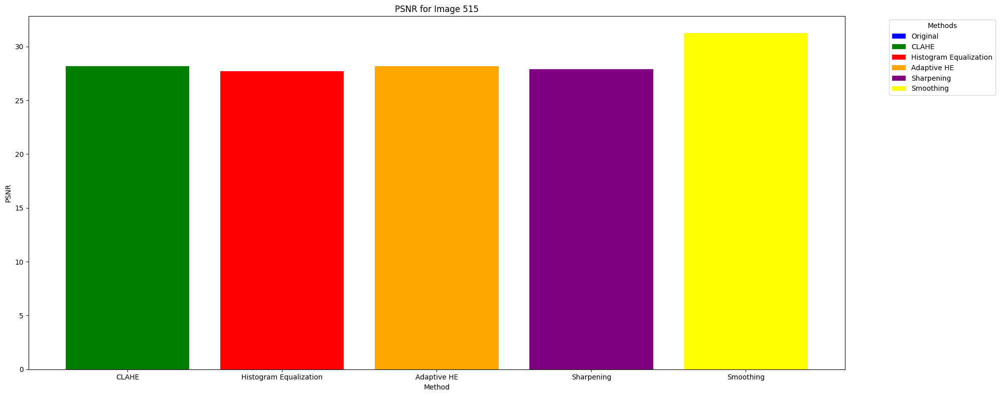

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/SSIM_plot_image_515.png


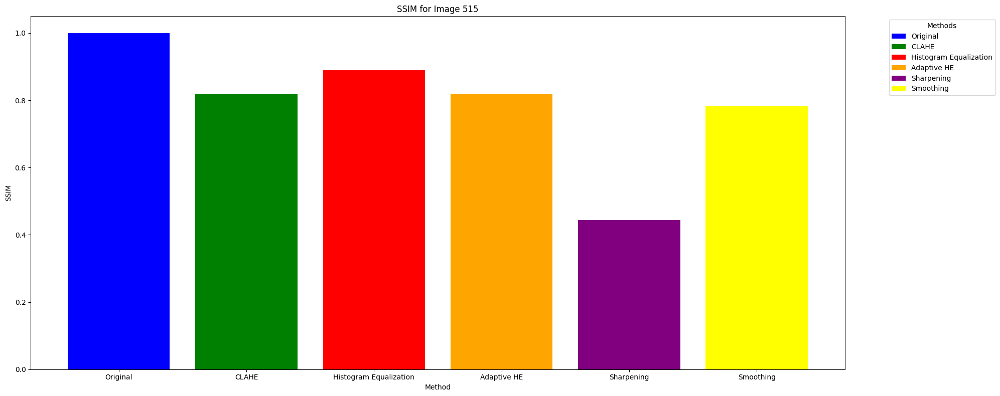

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/CoC_plot_image_515.png


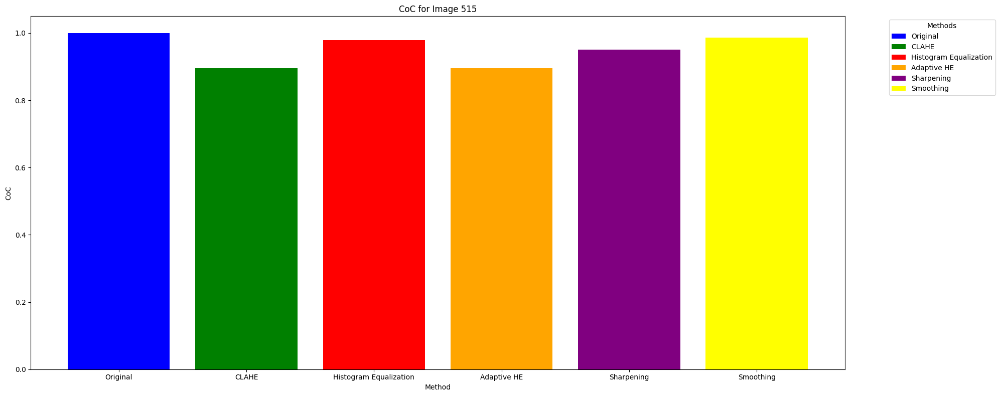

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/EPI_plot_image_515.png


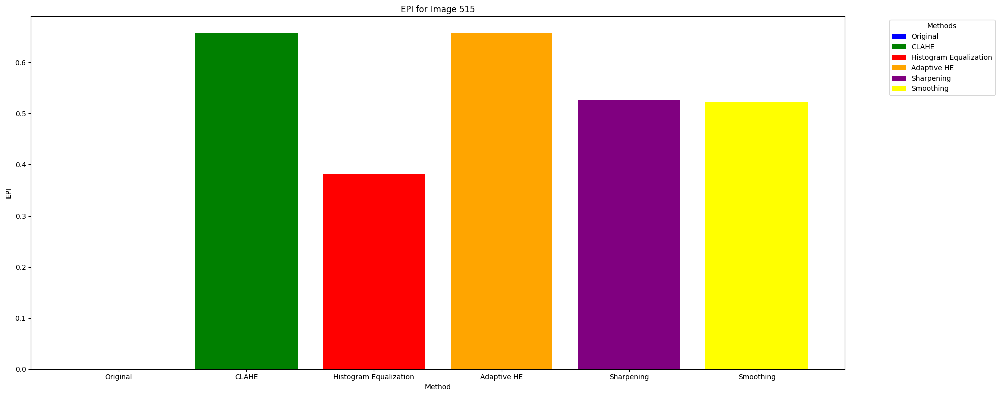

In [ ]:
for metric in metric_params:
    plot_metrics_bar(df_results, '515', metric, metric_folder)
    plot_metrics_bar_show(df_results, '515', metric)

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/PSNR_plot_image_858.png


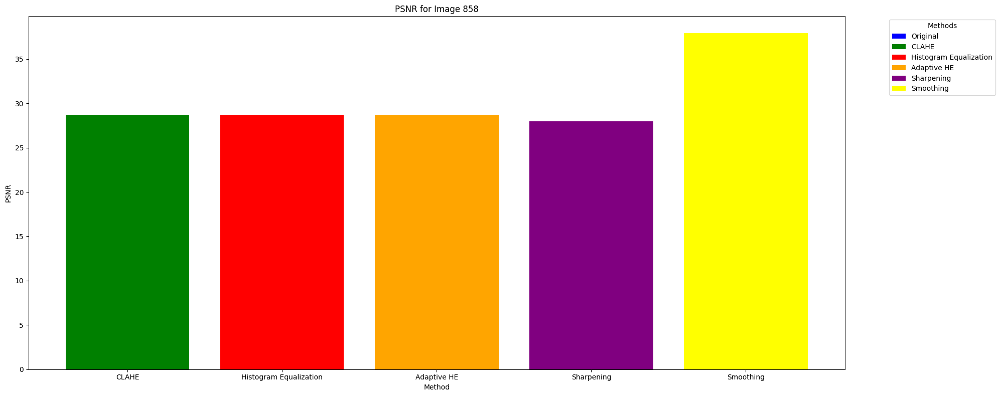

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/SSIM_plot_image_858.png


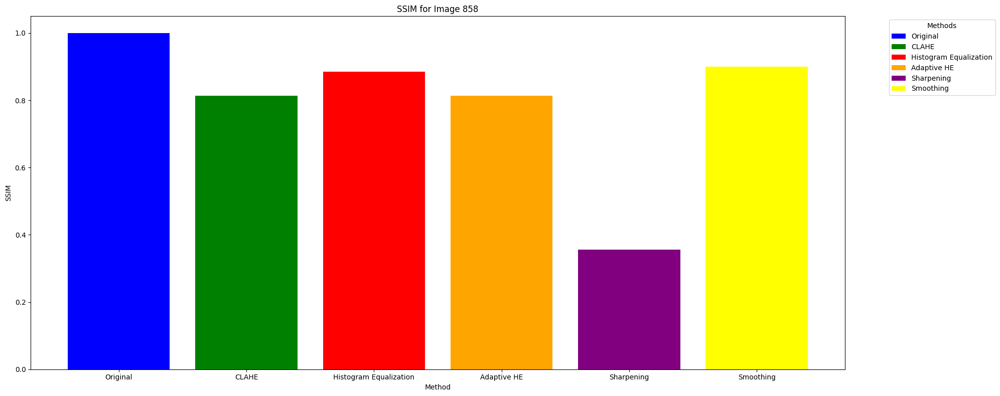

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/CoC_plot_image_858.png


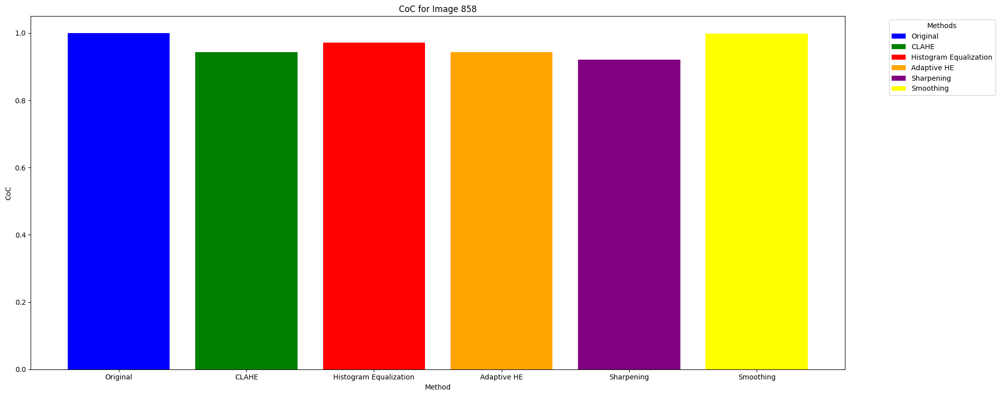

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/EPI_plot_image_858.png


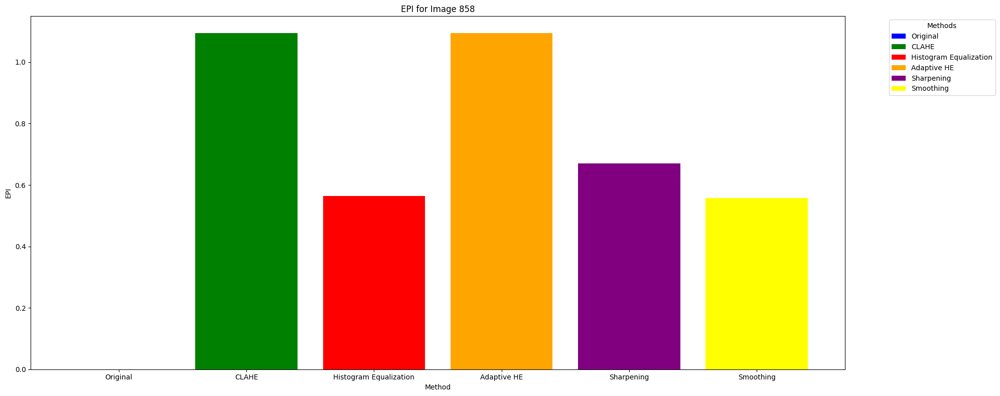

In [ ]:
for metric in metric_params:
    plot_metrics_bar(df_results, '858', metric, metric_folder)
    plot_metrics_bar_show(df_results, '858', metric)

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/PSNR_plot_image_469.png


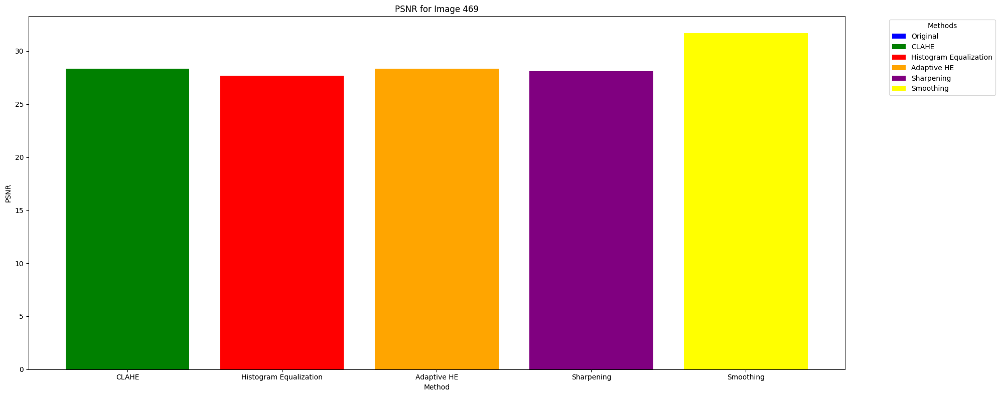

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/SSIM_plot_image_469.png


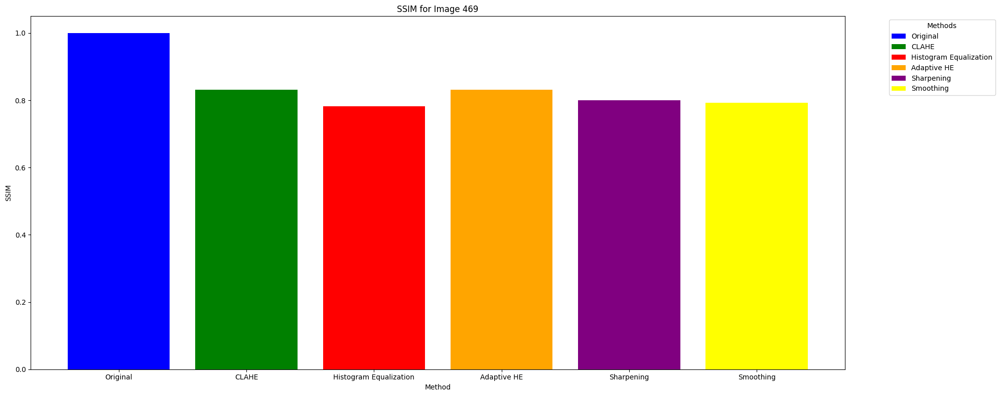

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/CoC_plot_image_469.png


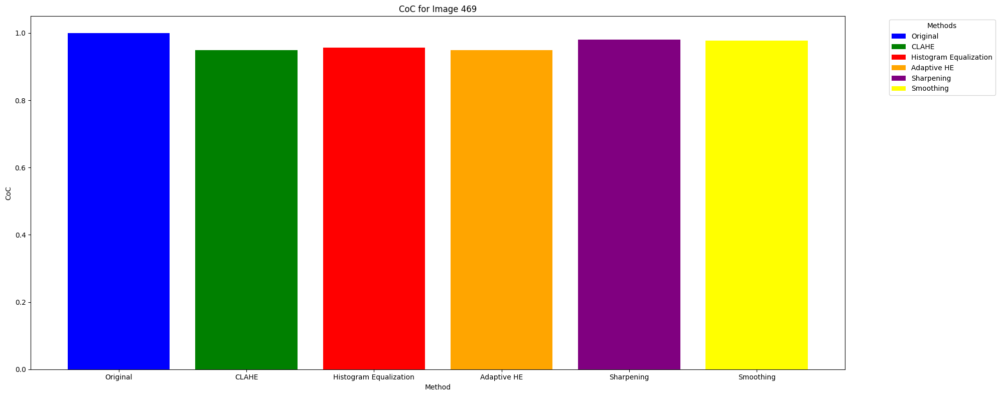

Plot saved as /content/drive/MyDrive/under_water_2/metric_images/EPI_plot_image_469.png


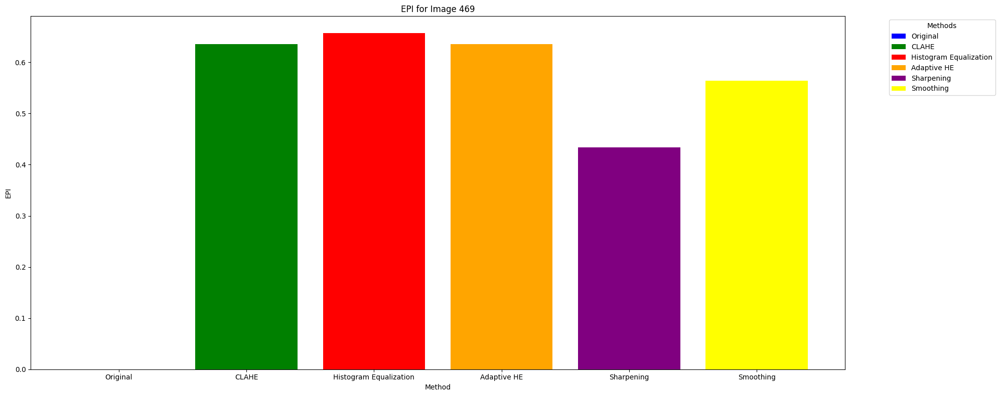

In [ ]:
for metric in metric_params:
    plot_metrics_bar(df_results, '469', metric, metric_folder)
    plot_metrics_bar_show(df_results, '469', metric)